In the name of GOD

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import pylab as py
import matplotlib.pyplot as plt

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving deliverytime.csv to deliverytime.csv


In [ ]:
import io
data = pd.read_csv(io.BytesIO(uploaded['deliverytime.csv']))

In [ ]:
data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30


The data set have 45593 rows and 11 columns


**Measuring the central Tendency**

In [ ]:
data.describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.544075,4.632367,17.017729,70.231332,17.465186,70.845702,26.294607
std,5.696793,0.327708,8.185109,22.883647,7.335122,21.118812,9.383806
min,15.000000,1.000000,-30.905562,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.600000,12.933284,73.170000,12.988453,73.280000,19.000000
50%,29.000000,4.700000,18.546947,75.898497,18.633934,76.002574,26.000000
75%,34.000000,4.800000,22.728163,78.044095,22.785049,78.107044,32.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,54.000000


In [ ]:
data.median()

<ipython-input-7-135339ac59ce>:1: FutureWarning: The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.median()


Delivery_person_Age            29.000000
Delivery_person_Ratings         4.700000
Restaurant_latitude            18.546947
Restaurant_longitude           75.898497
Delivery_location_latitude     18.633934
Delivery_location_longitude    76.002574
Time_taken(min)                26.000000
dtype: float64

In [ ]:
data.mode()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,3E+09,JAPRES11DEL02,29.0,4.6,0.0,0.0,0.13,0.13,Snack,motorcycle,26.0
1,4E+01,PUNERES01DEL01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4E+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4E+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5E+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,5E+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,5E+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,6E+01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,6E+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,6E+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**measuring the dispersion of data**

In [ ]:
data.quantile([.25, .5, .75], axis = 0)

<ipython-input-9-eb4468a86319>:1: FutureWarning: The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.quantile([.25, .5, .75], axis = 0)


,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
0.25,25.0,4.6,12.933284,73.170000,12.988453,73.280000,19.0
0.50,29.0,4.7,18.546947,75.898497,18.633934,76.002574,26.0
0.75,34.0,4.8,22.728163,78.044095,22.785049,78.107044,32.0


In [ ]:
data.columns

Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Type_of_order', 'Type_of_vehicle',
       'Time_taken(min)'],
      dtype='object')

In [ ]:
data.dtypes

ID                              object
Delivery_person_ID              object
Delivery_person_Age              int64
Delivery_person_Ratings        float64
Restaurant_latitude            float64
Restaurant_longitude           float64
Delivery_location_latitude     float64
Delivery_location_longitude    float64
Type_of_order                   object
Type_of_vehicle                 object
Time_taken(min)                  int64
dtype: object

In [ ]:
numeric_data = data.select_dtypes(exclude= 'object')
numeric_data

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
0,37,4.9,22.745049,75.892471,22.765049,75.912471,24
1,34,4.5,12.913041,77.683237,13.043041,77.813237,33
2,23,4.4,12.914264,77.678400,12.924264,77.688400,26
3,38,4.7,11.003669,76.976494,11.053669,77.026494,21
4,32,4.6,12.972793,80.249982,13.012793,80.289982,30
...,...,...,...,...,...,...,...
45588,30,4.8,26.902328,75.794257,26.912328,75.804257,32
45589,21,4.6,0.000000,0.000000,0.070000,0.070000,36
45590,30,4.9,13.022394,80.242439,13.052394,80.272439,16
45591,20,4.7,11.001753,76.986241,11.041753,77.026241,26


In [ ]:
for i in numeric_data.columns:
  Q1 = np.quantile(data[i], 0.25)
  Q3 = np.quantile(data[i], 0.75)
  IQR = Q3 - Q1
  print(" IQR values for column %s is : %s " % (i,IQR))

 IQR values for column Delivery_person_Age is : 9.0 
 IQR values for column Delivery_person_Ratings is : 0.20000000000000018 
 IQR values for column Restaurant_latitude is : 9.794878999999998 
 IQR values for column Restaurant_longitude is : 4.874094999999997 
 IQR values for column Delivery_location_latitude is : 9.796596000000001 
 IQR values for column Delivery_location_longitude is : 4.827044000000001 
 IQR values for column Time_taken(min) is : 13.0 


five number summery:

In [ ]:
data.describe().loc[['min','25%', '50%', '75%', 'max']]

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
min,15.0,1.0,-30.905562,-88.366217,0.010000,0.010000,10.0
25%,25.0,4.6,12.933284,73.170000,12.988453,73.280000,19.0
50%,29.0,4.7,18.546947,75.898497,18.633934,76.002574,26.0
75%,34.0,4.8,22.728163,78.044095,22.785049,78.107044,32.0
max,50.0,6.0,30.914057,88.433452,31.054057,88.563452,54.0


In [ ]:
filtered_data_1 = data[data['Type_of_order'] == "Meal "]
filtered_data_1.describe().loc[['min','25%', '50%', '75%', 'max']]

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
min,15.0,1.0,-30.902872,-85.325731,0.010000,0.010000,10.0
25%,25.0,4.5,12.914264,73.170283,12.985377,73.280446,19.0
50%,29.0,4.7,18.551440,75.897429,18.639156,75.997648,26.0
75%,34.0,4.8,22.728163,78.040165,22.791791,78.085283,33.0
max,50.0,6.0,30.914057,88.433452,31.054057,88.563452,54.0


In [ ]:
filtered_data_2 = data[data['Type_of_order'] == "Drinks "]
filtered_data_2.describe().loc[['min','25%', '50%', '75%', 'max']]

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
min,15.0,1.0,-30.899584,-88.349843,0.010000,0.010000,10.0
25%,25.0,4.5,12.933284,73.170000,12.985448,73.295012,19.0
50%,29.0,4.7,18.551440,75.894377,18.629299,75.996362,25.0
75%,34.0,4.8,22.732225,78.034714,22.783659,78.081187,32.0
max,50.0,6.0,30.914057,88.433452,31.045562,88.563187,54.0


boxplots

<Axes: title={'center': 'Time_taken(min)'}, xlabel='Type_of_order'>

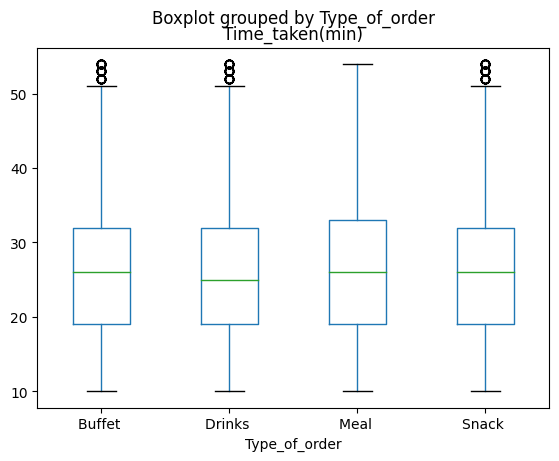

In [ ]:
#Boxplot of Type_of_order with respect Time_taken(min).

data.boxplot(by ='Type_of_order', column =['Time_taken(min)'], grid = False)


<Axes: title={'center': 'Time_taken(min)'}, xlabel='Type_of_vehicle'>

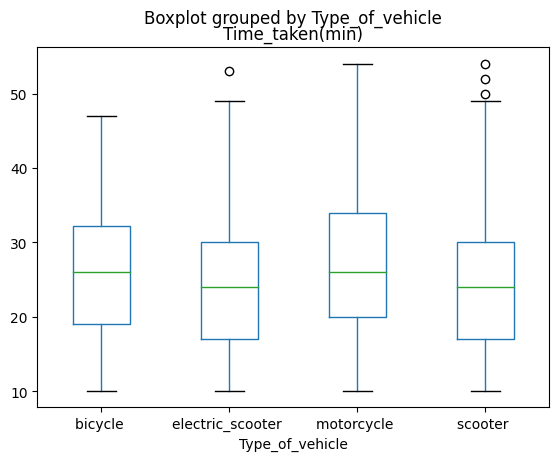

In [ ]:
#Boxplot of Type_of_vehicle with respect Time_taken(min).

data.boxplot(by ='Type_of_vehicle', column =['Time_taken(min)'], grid = False)

<Axes: title={'center': 'Delivery_person_Ratings'}, xlabel='Delivery_person_Age'>

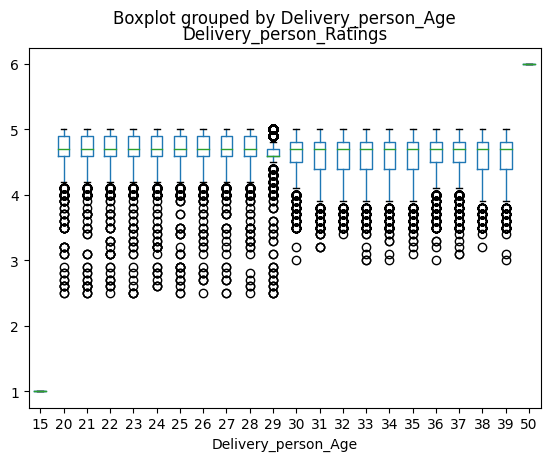

In [ ]:
#Boxplot of Delivery_person_Age with respect Delivery_person_Ratings.

data.boxplot(by ='Delivery_person_Age', column =['Delivery_person_Ratings'], grid = False)

histograms:

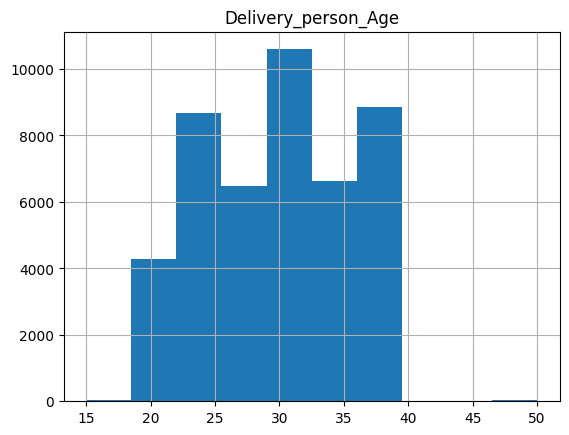

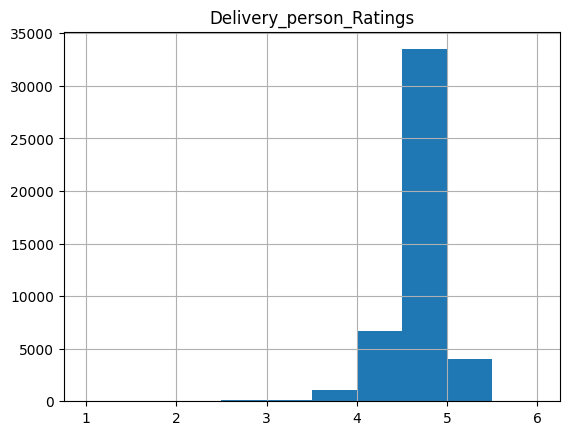

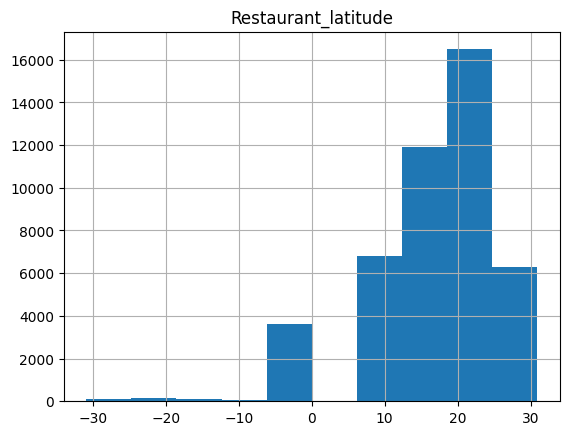

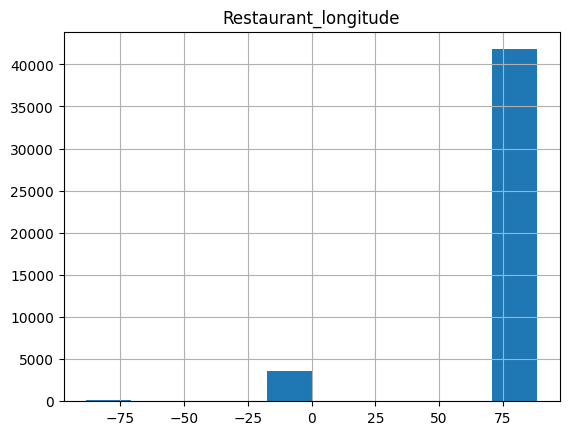

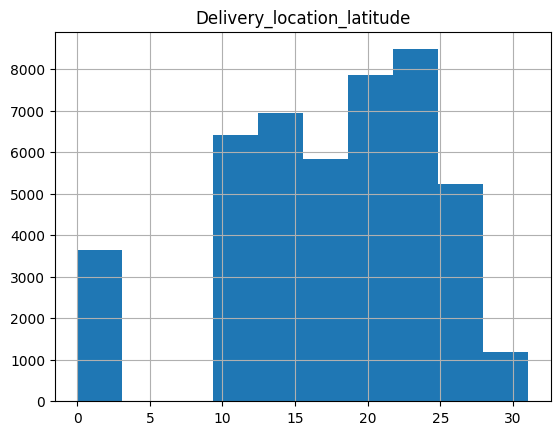

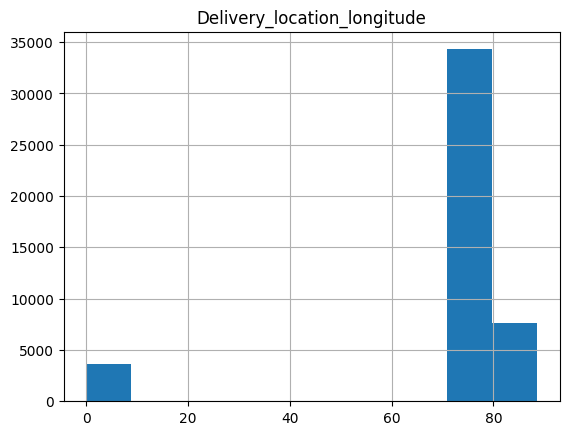

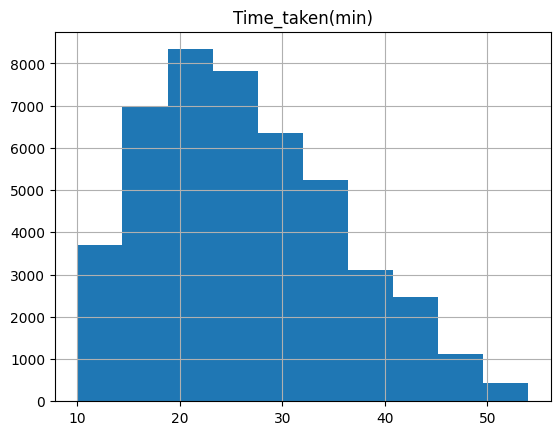

In [ ]:
for i in numeric_data.columns:
  data.hist(column=i)

quantile plots:

Q-Q plot :

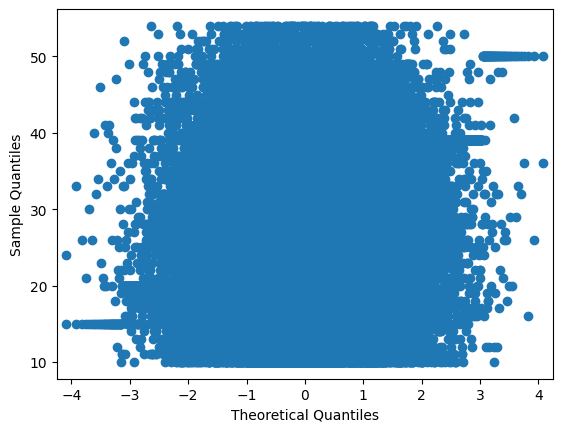

In [ ]:
q_q_data = data[['Time_taken(min)' , 'Delivery_person_Age']]
sm.qqplot(q_q_data)
py.show()

scatter plots:

<Axes: xlabel='Delivery_person_Age', ylabel='Delivery_person_Ratings'>

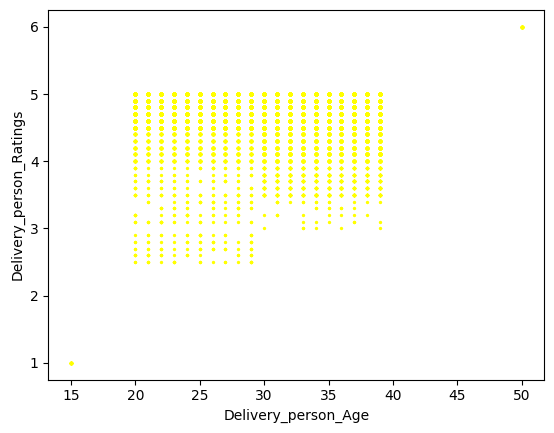

In [ ]:
data.plot.scatter(x = 'Delivery_person_Age', y = 'Delivery_person_Ratings', s = 2, c = 'yellow')

<Axes: xlabel='Time_taken(min)', ylabel='Delivery_person_Ratings'>

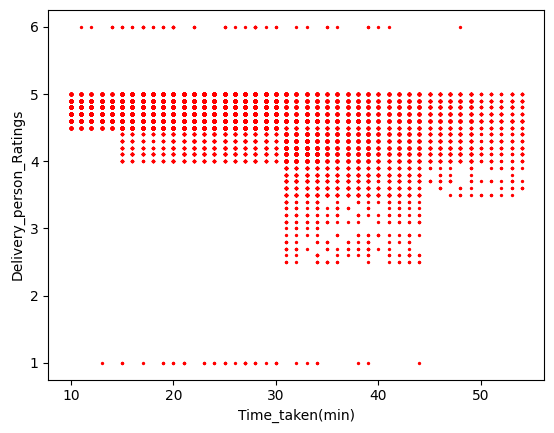

In [ ]:
data.plot.scatter(x = 'Time_taken(min)', y = 'Delivery_person_Ratings', s = 2 , c = 'red')

<Axes: xlabel='Time_taken(min)', ylabel='Delivery_person_Age'>

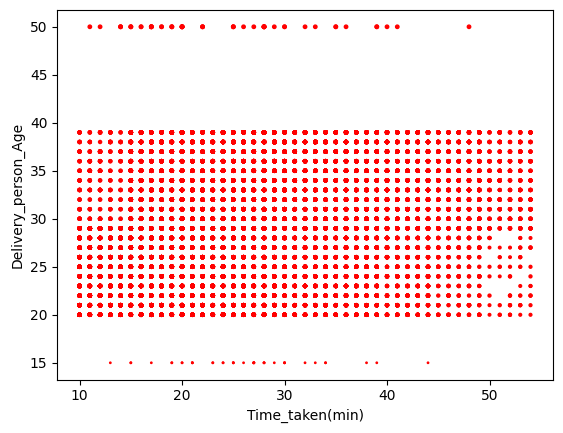

In [ ]:
data.plot.scatter(x = 'Time_taken(min)', y = 'Delivery_person_Age', s = 'Delivery_person_Ratings', c = 'red')

<Axes: xlabel='Time_taken(min)', ylabel='Restaurant_latitude'>

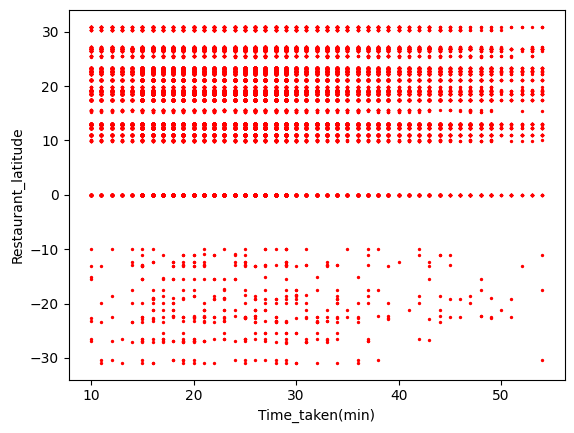

In [ ]:
data.plot.scatter(x = 'Time_taken(min)', y = 'Restaurant_latitude', s = 2 , c = 'red')

<Axes: xlabel='Time_taken(min)', ylabel='Restaurant_latitude'>

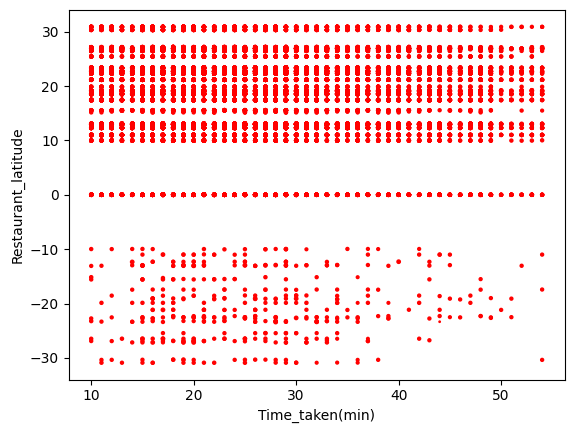

In [ ]:
data.plot.scatter(x = 'Time_taken(min)', y = 'Restaurant_latitude', s = 'Delivery_person_Ratings' , c = 'red')

finding outliers:

In [ ]:
def RemoveOutliers(df , col):
  Q1 = np.quantile(df[col], 0.25)
  Q3 = np.quantile(df[col], 0.75)
  IQR = Q3 - Q1
  print(" IQR values for column %s is : %s " % (col,IQR))
  l = Q1 - 1.5 * IQR
  u = Q3 + 1.5 * IQR




**Data visualization**

correlation matrix:

In [ ]:
data.corr()

<ipython-input-28-c44ded798807>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  data.corr()


,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
Delivery_person_Age,1.000000,-0.067449,-0.001955,-0.006796,0.002359,-0.000593,0.292708
Delivery_person_Ratings,-0.067449,1.000000,-0.004846,-0.011147,-0.010198,-0.013350,-0.331103
Restaurant_latitude,-0.001955,-0.004846,1.000000,0.661784,0.866378,0.602713,0.013981
Restaurant_longitude,-0.006796,-0.011147,0.661784,1.000000,0.632293,0.915026,0.007821
Delivery_location_latitude,0.002359,-0.010198,0.866378,0.632293,1.000000,0.690515,0.014243
Delivery_location_longitude,-0.000593,-0.013350,0.602713,0.915026,0.690515,1.000000,0.007625
Time_taken(min),0.292708,-0.331103,0.013981,0.007821,0.014243,0.007625,1.000000


scatterplot matrix

In [ ]:
import plotly.express as px
fig = px.scatter_matrix(data)
fig.show()
fig = px.scatter_matrix(data,
    dimensions=["Delivery_person_Age", "Delivery_person_Ratings", "Restaurant_latitude", "Restaurant_longitude"],
    color="Type_of_order")
fig.show()

parralel coordinate plot

In [ ]:
import plotly.express as px
fig = px.parallel_coordinates(data, color="Time_taken(min)",
                              dimensions=['Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_longitude',
                                          'Restaurant_latitude'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

Treemap

In [ ]:
import plotly.express as px

fig = px.treemap(data, path=[px.Constant("all"), 'Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_longitude'], values='Time_taken(min)')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()

**sampling**

         ID Delivery_person_ID  Delivery_person_Age  Delivery_person_Ratings  \
6990   4112      MYSRES03DEL01                   23                      4.8   
2691    E72    COIMBRES14DEL03                   21                      4.6   
18375  5FF0      MUMRES11DEL03                   28                      4.6   
43254  2FCE      JAPRES18DEL03                   38                      4.5   
13571  D150      KNPRES11DEL02                   26                      4.7   

       Restaurant_latitude  Restaurant_longitude  Delivery_location_latitude  \
6990             12.299524             76.642620                   12.409524   
2691             11.003681             76.975525                   11.093681   
18375            18.994237             72.825553                   19.024237   
43254            26.913987             75.752891                   26.943987   
13571            26.474986             80.342796                   26.554986   

       Delivery_location_longitude Typ

<ipython-input-35-f86c14669469>:10: FutureWarning:

The default value of numeric_only in DataFrame.median is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.

<ipython-input-35-f86c14669469>:14: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Axes(0.125,0.11;0.775x0.77)
Axes(0.125,0.11;0.775x0.77)
Axes(0.125,0.11;0.775x0.77)
Axes(0.125,0.11;0.775x0.77)
                             Delivery_person_Age  Delivery_person_Ratings  \
Delivery_person_Age                     1.000000                 0.001025   
Delivery_person_Ratings                 0.001025                 1.000000   
Restaurant_latitude                     0.008656                -0.005546   
Restaurant_longitude                    0.002879                -0.018159   
Delivery_location_latitude              0.008569                -0.011681   
Delivery_location_longitude             0.006446                -0.018696   
Time_taken(min)                        -0.009029                -0.331620   

                             Restaurant_latitude  Restaurant_longitude  \
Delivery_person_Age                     0.008656              0.002879   
Delivery_person_Ratings                -0.005546             -0.018159   
Restaurant_latitude                     1.000000 

<ipython-input-35-f86c14669469>:54: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



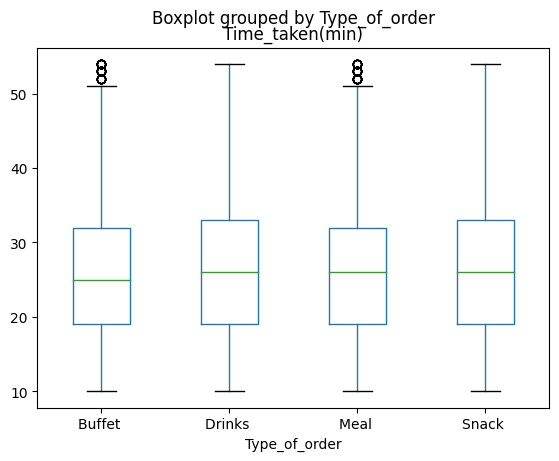

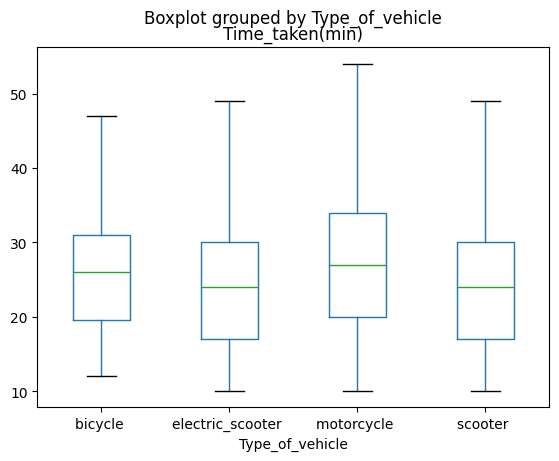

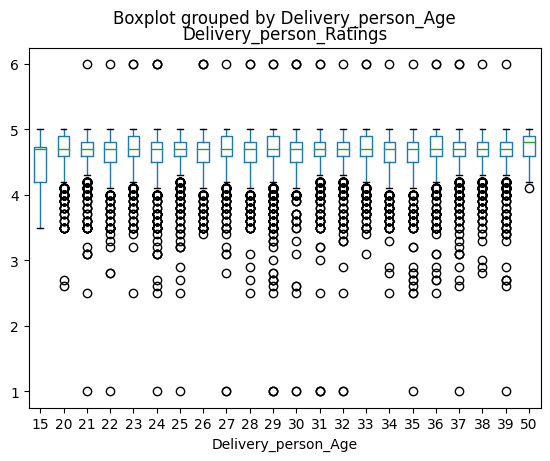

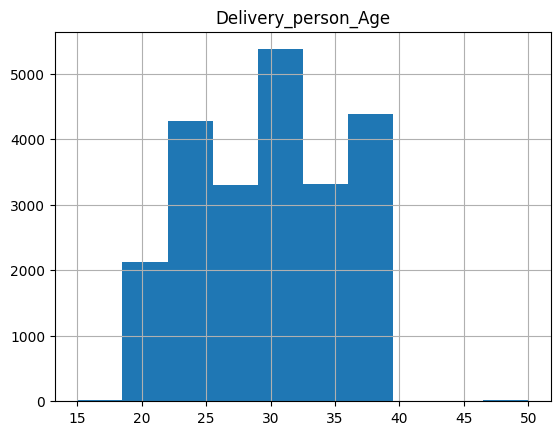

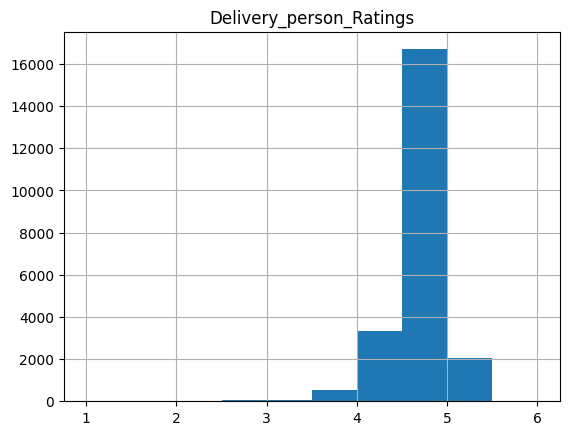

...

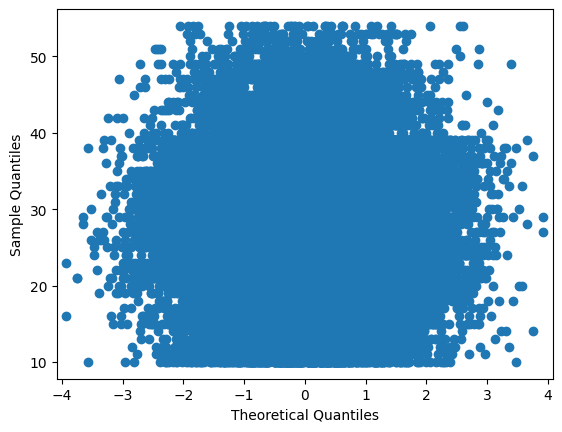

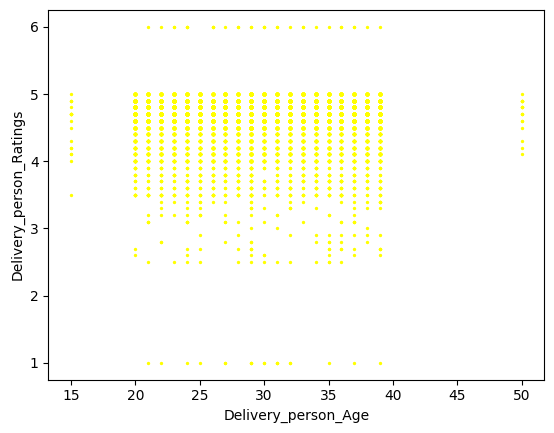

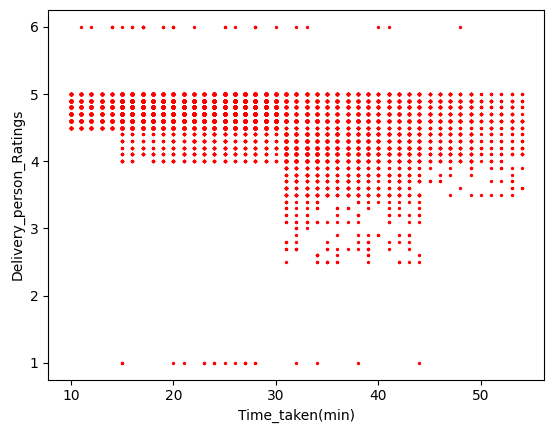

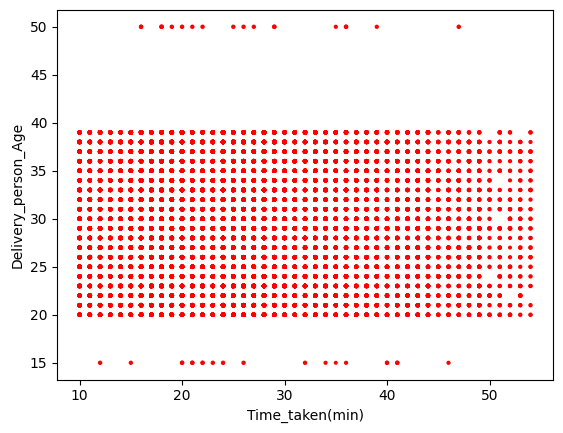

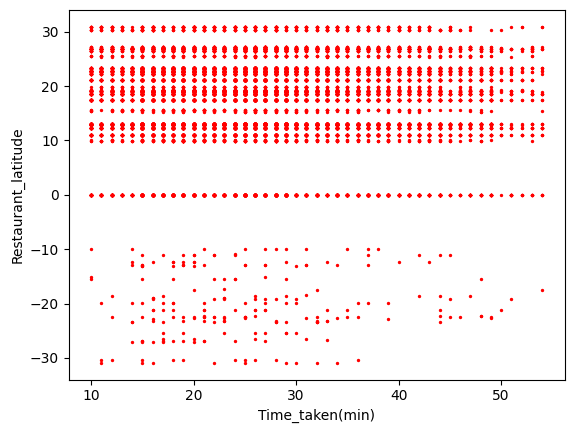

In [ ]:
sample = data.sample(frac =.5)

print(sample.head())

# sample size
print(f'The sample have {sample.shape[0]} rows and {sample.shape[1]} columns')

print(sample.describe())

print(sample.median())

print(sample.mode())

print(sample.quantile([.25, .5, .75], axis = 0))


numeric_sample = sample.select_dtypes(exclude= 'object')
print(numeric_sample)

for i in numeric_sample.columns:
  Q1 = np.quantile(sample[i], 0.25)
  Q3 = np.quantile(sample[i], 0.75)
  IQR = Q3 - Q1
  print(" IQR values for column %s is : %s " % (i,IQR))

print(sample.describe().loc[['min','25%', '50%', '75%', 'max']])

  #Boxplot of Type_of_order with respect Time_taken(min).

sample.boxplot(by ='Type_of_order', column =['Time_taken(min)'], grid = False)

#Boxplot of Type_of_vehicle with respect Time_taken(min).

sample.boxplot(by ='Type_of_vehicle', column =['Time_taken(min)'], grid = False)

#Boxplot of Delivery_person_Age with respect Delivery_person_Ratings.

sample.boxplot(by ='Delivery_person_Age', column =['Delivery_person_Ratings'], grid = False)

for i in numeric_sample.columns:
  sample.hist(column=i)

q_q_sample = sample[['Time_taken(min)' , 'Delivery_person_Age']]
sm.qqplot(q_q_sample)

print(sample.plot.scatter(x = 'Delivery_person_Age', y = 'Delivery_person_Ratings', s = 2, c = 'yellow'))

print(sample.plot.scatter(x = 'Time_taken(min)', y = 'Delivery_person_Ratings', s = 2 , c = 'red'))

print(sample.plot.scatter(x = 'Time_taken(min)', y = 'Delivery_person_Age', s = 'Delivery_person_Ratings', c = 'red'))

print(sample.plot.scatter(x = 'Time_taken(min)', y = 'Restaurant_latitude', s = 2 , c = 'red'))

print(sample.corr())

import plotly.express as px
fig = px.scatter_matrix(sample)
fig.show()
fig = px.scatter_matrix(sample,
    dimensions=["Delivery_person_Age", "Delivery_person_Ratings", "Restaurant_latitude", "Restaurant_longitude"],
    color="Type_of_order")
fig.show()

import plotly.express as px
fig = px.parallel_coordinates(sample, color="Time_taken(min)",
                              dimensions=['Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_longitude',
                                          'Restaurant_latitude'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=2)
fig.show()

import plotly.express as px

fig = px.treemap(sample, path=[px.Constant("all"), 'Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_longitude'], values='Time_taken(min)')
fig.update_traces(root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.show()